In [24]:
source("lib/DBDA2E-utilities.R")


*********************************************************************
Kruschke, J. K. (2015). Doing Bayesian Data Analysis, Second Edition:
A Tutorial with R, JAGS, and Stan. Academic Press / Elsevier.
*********************************************************************



Warning message:
: package ‘rjags’ was built under R version 3.2.5

# Code taken from `BernMetrop.R` (JR Kruschke 2015)

In [25]:

# Specify the data, to be used in the likelihood function.
myData = c(rep(0,6),rep(1,14))

# Define the Bernoulli likelihood function, p(D|theta).
# The argument theta could be a vector, not just a scalar.
likelihood = function( theta , data ) {
  z = sum( data )
  N = length( data )
  pDataGivenTheta = theta^z * (1-theta)^(N-z)
  # The theta values passed into this function are generated at random,
  # and therefore might be inadvertently greater than 1 or less than 0.
  # The likelihood for theta > 1 or for theta < 0 is zero:
  pDataGivenTheta[ theta > 1 | theta < 0 ] = 0
  return( pDataGivenTheta )
}

In [26]:
# Define the prior density function. 
prior = function( theta ) {
  pTheta = dbeta( theta , 1 , 1 )
  # The theta values passed into this function are generated at random,
  # and therefore might be inadvertently greater than 1 or less than 0.
  # The prior for theta > 1 or for theta < 0 is zero:
  pTheta[ theta > 1 | theta < 0 ] = 0
  return( pTheta )
}

In [27]:
# Define the relative probability of the target distribution, 
# as a function of vector theta. For our application, this
# target distribution is the unnormalized posterior distribution.
targetRelProb = function( theta , data ) {
  targetRelProb =  likelihood( theta , data ) * prior( theta )
  return( targetRelProb )
}

In [39]:

runWalk <- function(proposalSD, initialTrajectory=0.01){
    # Specify the length of the trajectory, i.e., the number of jumps to try:
    trajLength = 50000 # arbitrary large number
    # Initialize the vector that will store the results:
    trajectory = rep( 0 , trajLength )
    # Specify where to start the trajectory:
    trajectory[1] = initialTrajectory # arbitrary value
    # Specify the burn-in period:
    burnIn = ceiling( 0.0 * trajLength ) # arbitrary number, less than trajLength
    # Initialize accepted, rejected counters, just to monitor performance:
    nAccepted = 0
    nRejected = 0

    # Now generate the random walk. The 't' index is time or trial in the walk.
    # Specify seed to reproduce same random walk:
    #set.seed(47405)

    # Specify standard deviation of proposal distribution:

    for ( t in 1:(trajLength-1) ) {
        currentPosition = trajectory[t]
        # Use the proposal distribution to generate a proposed jump.
        proposedJump = rnorm( 1 , mean=0 , sd=proposalSD )
        # Compute the probability of accepting the proposed jump.
        probAccept = min( 1,
            targetRelProb( currentPosition + proposedJump , myData )
            / targetRelProb( currentPosition , myData ) )
        # Generate a random uniform value from the interval [0,1] to
        # decide whether or not to accept the proposed jump.
        if ( runif(1) < probAccept ) {
            # accept the proposed jump
            trajectory[ t+1 ] = currentPosition + proposedJump
            # increment the accepted counter, just to monitor performance
            if ( t > burnIn ) { nAccepted = nAccepted + 1 }
        } else {
            # reject the proposed jump, stay at current position
            trajectory[ t+1 ] = currentPosition
            # increment the rejected counter, just to monitor performance
            if ( t > burnIn ) { nRejected = nRejected + 1 }
        }
    }

    # Extract the post-burnIn portion of the trajectory.
    acceptedTraj = trajectory[ (burnIn+1) : length(trajectory) ]
    list(
        acceptedTraj = acceptedTraj, 
        trajectory=trajectory, 
        trajLength=trajLength, 
        burnIn=burnIn,
        nAccepted = nAccepted,
        nRejected = nRejected
    )
}
# End of Metropolis algorithm.

#-----------------------------------------------------------------------
# Display the chain.

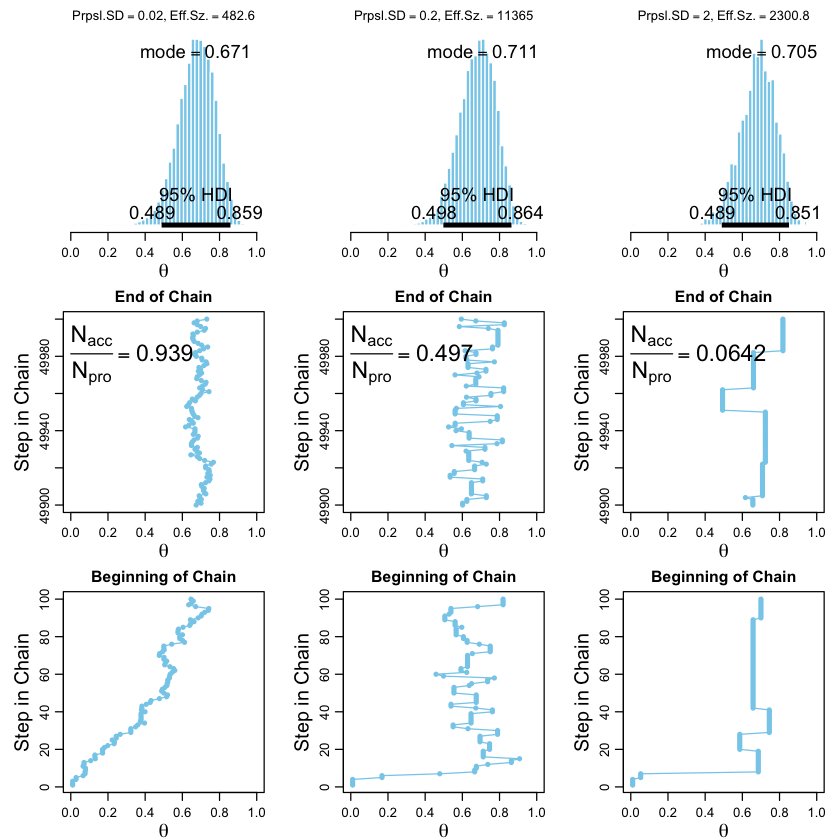

In [29]:
plotResult <- function(results){
    list2env(results, envir = .GlobalEnv)
    # Posterior histogram:
    paramInfo = plotPost( acceptedTraj , xlim=c(0,1) , xlab=bquote(theta) , 
                          cex.main=1.0 ,
                          main=bquote( list( "Prpsl.SD" == .(proposalSD) ,
                          "Eff.Sz." == .(round(effectiveSize(acceptedTraj),1)) ) ) )

    # Trajectory, a.k.a. trace plot, end of chain:
    idxToPlot = (trajLength-100):trajLength
    plot( trajectory[idxToPlot] , idxToPlot , main="End of Chain" ,
          xlab=bquote(theta) , xlim=c(0,1) , ylab="Step in Chain" ,
          type="o" , pch=20 , col="skyblue" , cex.lab=1.5 )
    # Display proposal SD and acceptance ratio in the plot.
    text( 0.0 , trajLength , adj=c(0.0,1.1) , cex=1.75 ,
          labels = bquote( frac(N[acc],N[pro]) == 
                           .(signif( nAccepted/length(acceptedTraj) , 3 ))))

    # Trajectory, a.k.a. trace plot, beginning of chain:
    idxToPlot = 1:100
    plot( trajectory[idxToPlot] , idxToPlot , main="Beginning of Chain" ,
          xlab=bquote(theta) , xlim=c(0,1) , ylab="Step in Chain" ,
          type="o" , pch=20 , col="skyblue" , cex.lab=1.5 )
    # Indicate burn in limit (might not be visible if not in range):
    if ( burnIn > 0 ) {
      abline(h=burnIn,lty="dotted")
      text( 0.5 , burnIn+1 , "Burn In" , adj=c(0.5,1.1) )
    }
}



layout( matrix(1:9,nrow=3) )
par(mar=c(3,4,2,1),mgp=c(2,0.7,0))


for(proposalSD in c(0.02,0.2,2)){
    results <- runWalk(proposalSD)
    plotResult(results)

}

The above plots show traces from a Metropolis sampling algorithm. The chain samples the prior distribution for a beta-distributed likelihood with a non-informative uniform beta prior.

At each step, the change in proposal parameter value is generated by a normal random value, with a $\mu = 0$ and $\sigma = 0.02, 0.2, 2$.

The plots show the density of accepted values and a trace of the proposals at the start and end of the chain. The plots show that for smaller $\sigma$ the chain is more restricted to the space of parameters it will explore. While the posterior distribution does converge on the target, it does so in a more "piecewise" fashion, meandering within subspaces of the parameter values. While disadvantageous for the quality of the output, this has the property that more samples are accepted (evidenced by the lack of vertical lines in the trace plots and the high proportion of accepted samples).

The right-most column shows what happens when the jumps are too large. Very few proposals are accepted.

Considering the ACF of the chains, the left-most chain has the highest autocorrelation (clumpiness). If we consider the autocorrelation in light of the efficiency, higher autocorrelations reduce the effective sample size due to the lack of novelty.

Considering the values we've looked at, the best choice for $\sigma$ is 0.2. It balances the proportion of accepted samples well (~50%) and produces the greatest effective sample size of the three choices.

## Exercise 7.2: Autocorrelation

Focusing on autocorrelation diagnostics now; we want to understand how "novel" the samples out of our chain are in terms of their predecessors. We can measure this with the autocorrelation function. To start with, sample from a chain with a chosen SD:

In [30]:
proposalSD <- 2
results <- runWalk(proposalSD)
list2env(results, envir=.GlobalEnv)

<environment: R_GlobalEnv>

Now we have some samples, we can show how correlated they are using the `acf` function.

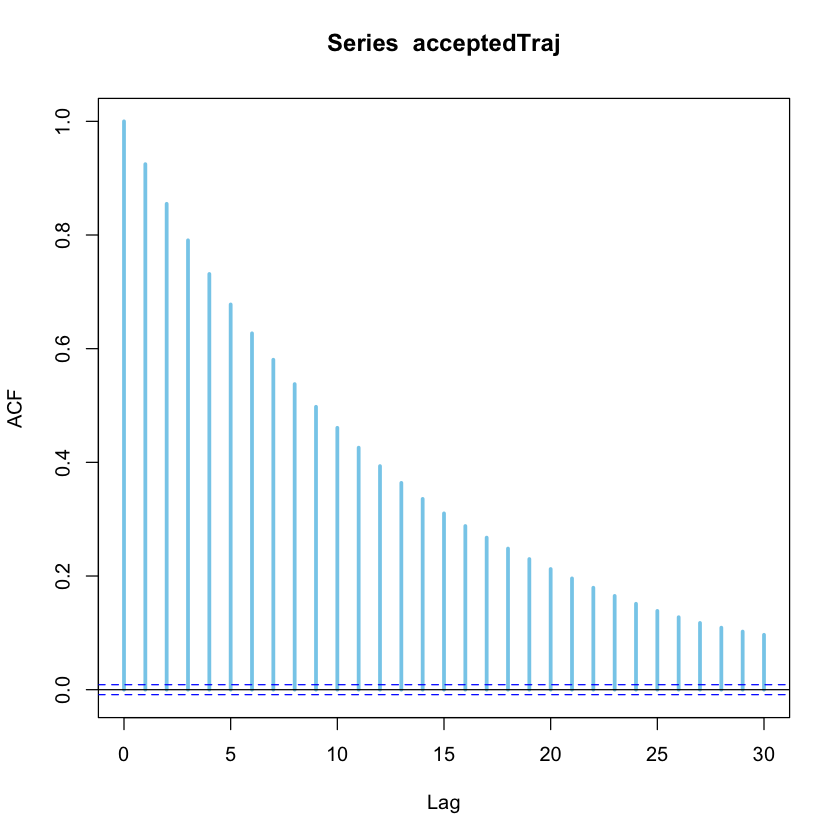

In [31]:
acf(acceptedTraj, lag.max=30, col="skyblue", lwd=3)

The above plot shows the autocorrelation of the chain for the chosen SD (0.2). This shows that there is very little correlation between samples. This can be thought of as showing how similar a value is to the ones before it; after 10 samples from the chain it's practically indistinguishable.

In addition to looking at the ACF of our samples, we can also look at how the distribution of values compares to the lagged values. We do this by generating two vectors; one with the last $n$ values removed, and one with the first $n$ terms removed. If we plot these pairs, it shows us the value at $t$ and $t+n$ on each axis respectively. This gives us a more direct visualisation of the ACF for a given lag $n$. In this case, we're looking at $n=10$.

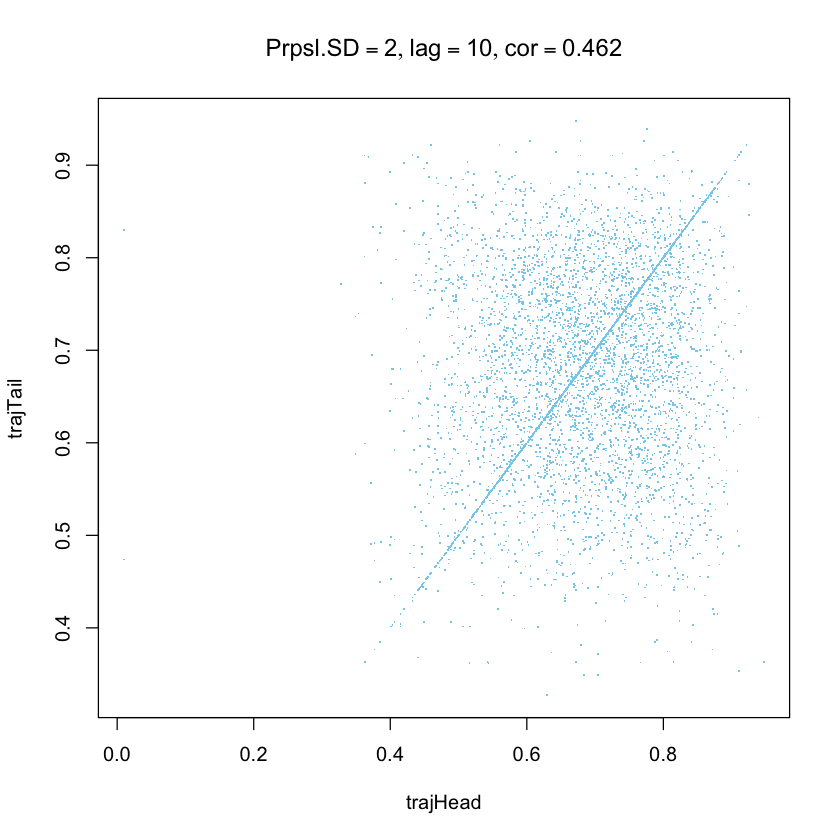

In [32]:
Len = length(acceptedTraj)
Lag = 10
trajHead = acceptedTraj[1: (Len-Lag) ]
trajTail = acceptedTraj[(1+Lag) : Len]
plot(trajHead, trajTail, pch=".", col="skyblue", main = bquote(
    list("Prpsl.SD" == .(proposalSD),
         lag == .(Lag),
         cor == .(round(cor(trajHead, trajTail),3))
        )
))

The plot confirms the low ACF value for this lag; there is very little correlation between samples from the chain with a lag of 10.

When we use the largest proposal SD we can see a dense line on the diagonal. This is due to the low acceptance of proposals from the chain. Long runs of the same values are commonplace, and thus values are highly autocorrelated up to large lags.

# Another prior: multimodal

Let's replace the prior with another: $p(\theta) = {(cos({4\pi\theta}) + 1)^2} / {1.5}$

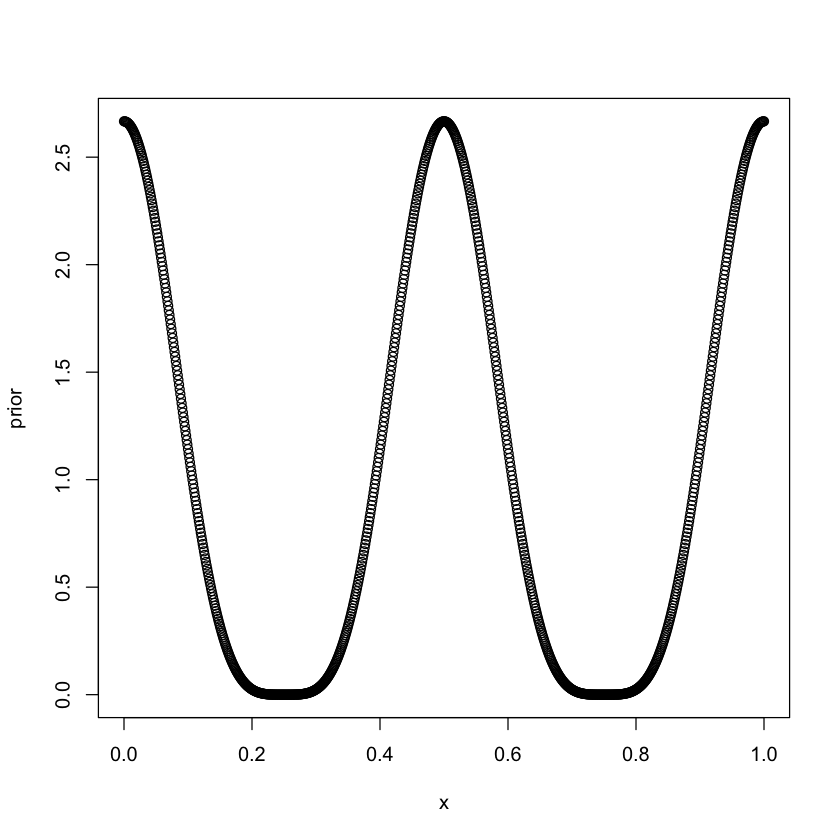

In [33]:
dx <- 0.001
x <- seq(0,1,by=dx)
prior <- (cos(4 * pi * x) + 1)**2 / 1.5
plot(x,prior)

In [34]:
prior <- function(theta){
    ifelse(theta <0 || theta > 1, 0,  (cos(4 * pi * theta) + 1)**2 / 1.5)
}

In [35]:
myData <- c()

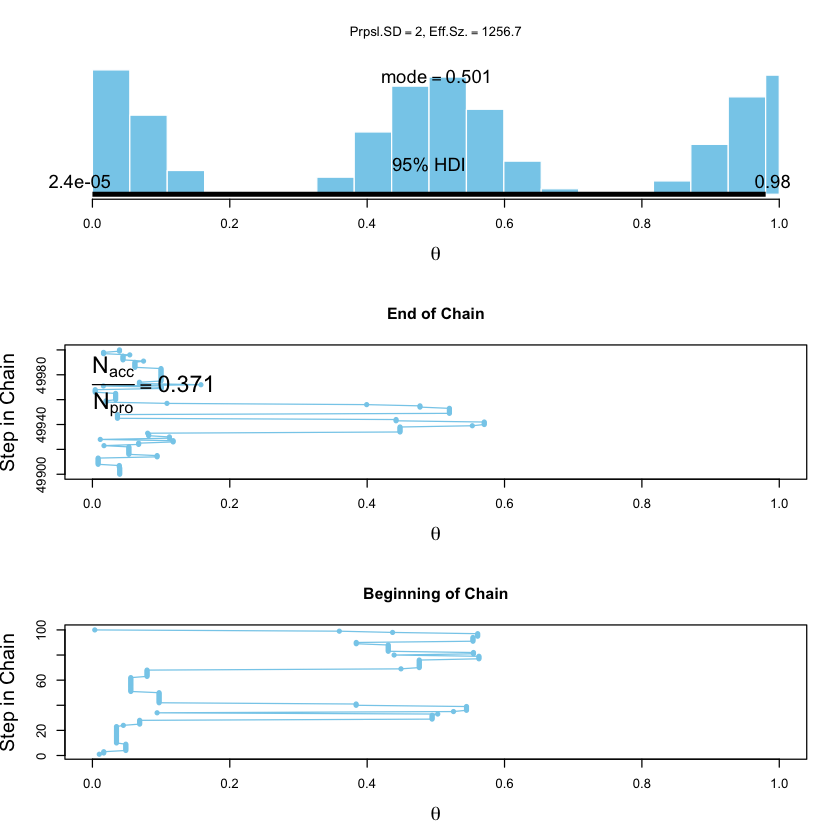

In [36]:
results <- runWalk(0.2)
layout(matrix(1:3, ncol=1))
plotResult(results)

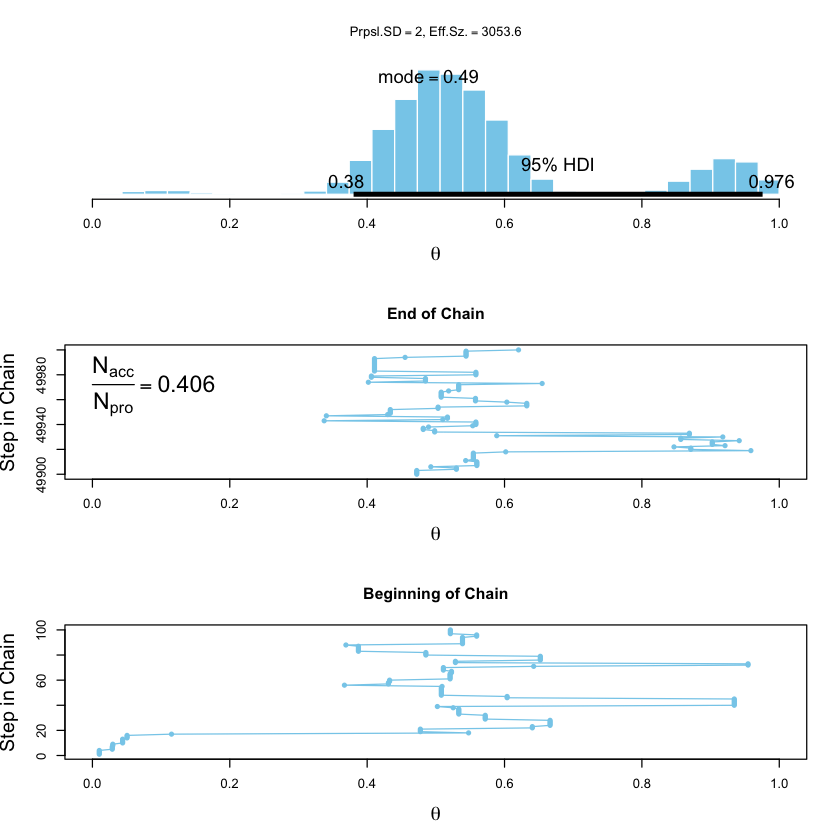

In [37]:
myData <- c(0,1,1)
results <- runWalk(0.2)
layout(matrix(1:3, ncol=1))
plotResult(results)

The above plot shows what happens when the multimodal prior is used to estimate $\theta$. We're still using the fairly good proposal $\sigma$ so the sampling still works; we see the 95% HDI contains the most credible peaks of our prior based on the observed data.

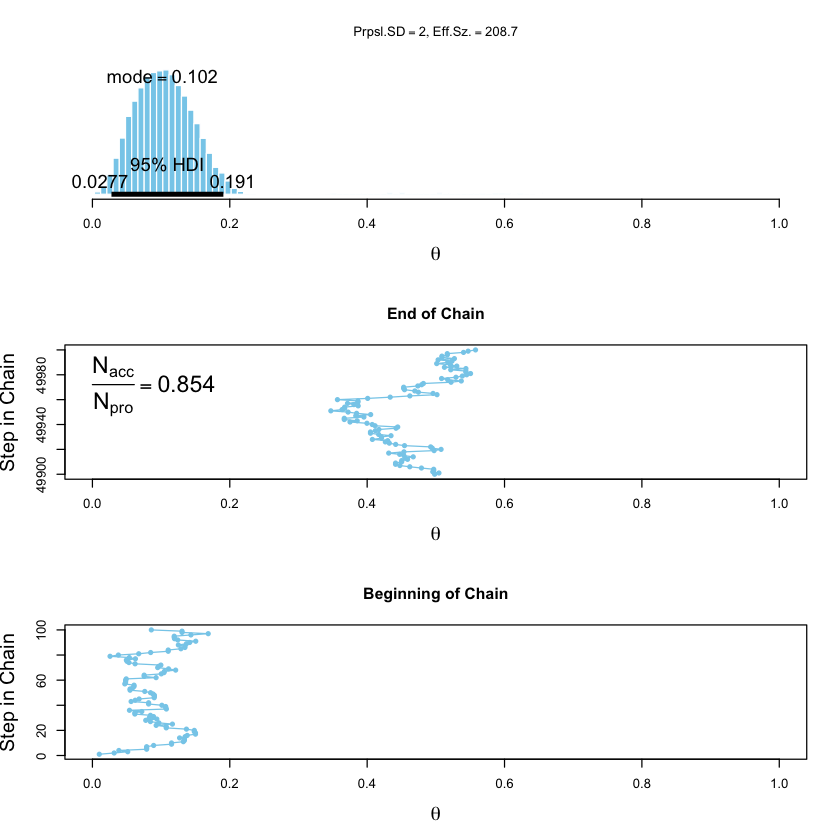

In [38]:
results <- runWalk(0.02)
layout(matrix(1:3, ncol=1))
plotResult(results)

With a small jump size and a multimodal prior, it's almost impossible for it to make a jump large enough to explore the other, more likely, parts of the sample space.

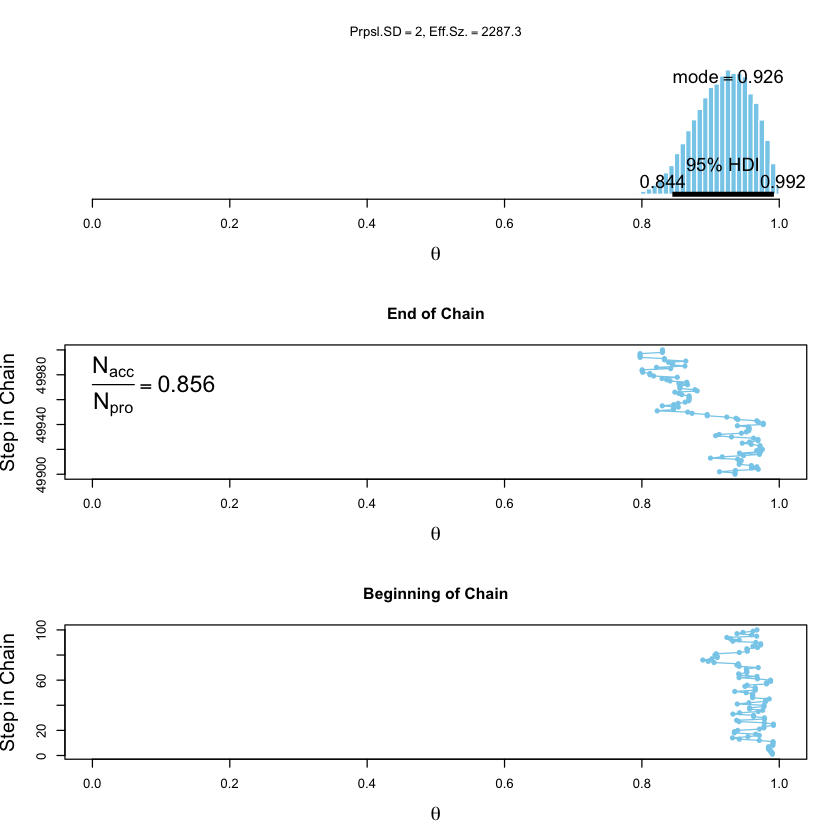

In [40]:
results <- runWalk(0.02, initialTrajectory = 0.99)
layout(matrix(1:3, ncol=1))
plotResult(results)